# Module 1: IMAGE PREPROCESSING

Module 1: Image Preprocessing
Christian Mata, PhD

# Exercise 1

**Before starting:**

- Create a GitHub repository to upload the solution of this exercise.
- Share this GitHub link to your professor.

**Objectives**

Generate a single Python notebook implementing and answering the following questions:

**- Task 1:** Load the built-in image 'coffee' of the skimage libraries. Details can be found at https://scikit-image.org/docs/stable/auto_examples/data/plot_general.html#sphx-glr-auto-examples-data-plot-general-py

**- Task 2:** Use the skimage function random_noise to add each of the 7 different types of noise available and generate a 4x2 panel figure with the original image and the 7 corrupted versions. The noise types are:

* ‘gaussian’ Gaussian-distributed additive noise.
* ‘localvar’ Gaussian-distributed additive noise, with specified
local variance at each point of image.
* ‘poisson’ Poisson-distributed noise generated from the data.
* ‘salt’ Replaces random pixels with 1.
* ‘pepper’ Replaces random pixels with 0 (for unsigned images) or
-1 (for signed images).
* ‘s&p’ Replaces random pixels with either 1 or low_val, where
low_val is 0 for unsigned images or -1 for signed images.
* ‘speckle’ Multiplicative noise using out = image + n*image, where
n is Gaussian noise with specified mean & variance.

Documentation of the function can be found at
https://scikit-image.org/docs/stable/api/skimage.util.html#skimage.util.random_noise

**- Task 3:** Select one of the noise types and generate 3 noisy images with different noise intensity levels. Represent the original image along with them in a 2x2 figure.

**- Task 4: **The standard deviation for Gaussian kernel affects the behavior of the gaussian filter (parameter sigma, see documentation https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.gaussian). Explore the effect of the parameter sigma when applying a gaussian filter to the tree noisy images generated in the previus task. Represent and comment the results.

**- Task 5:** Detect the edges of the bricks in the built-in image 'bricks' using a Prewitt edge detection filter. Quantify what is the fraction of the image corresponding to bricks and to edges.

**- Task 6:** Apply a high-pass filter and a low-pass filter in the frequency domain to the skimage built-in image 'grass'. Represent the results and discuss the correspondance between spatial patterns in the original image and high/low frequency components of its the Fourier transform.

**- Task 7:** Use the function binary_blobs to generate an image with random blobs: https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.binary_blobs
How many consecutive morphological erosions are needed in order to remove all the blobs? Use a disk-shaped structuring element of radius 3 pixels (footprint). https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk




# *Task 1*

## "Coffee" Loading

<ipython-input-101-a54e4be57454>:4: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC) # visualize image using imshow function
<ipython-input-101-a54e4be57454>:5: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


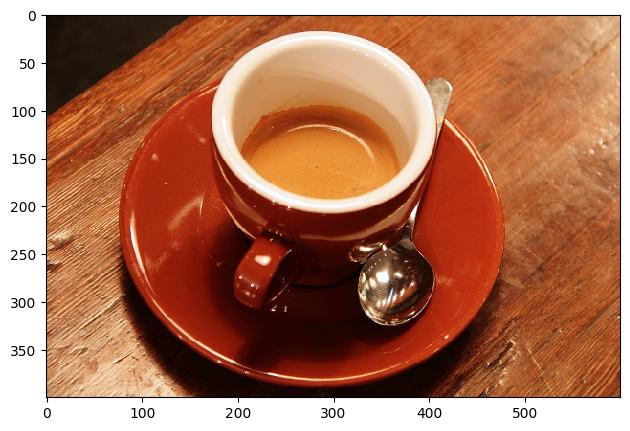

M = 400 columns, N = 600 rows, NC = 3 color channels


In [101]:
import skimage as sk
IC = sk.data.coffee()
sk.io.imshow(IC) # visualizing image using imshow function
sk.io.show()
print('M = {} columns, N = {} rows, NC = {} color channels'.format(*IC.shape)) # Printing out image size

# **Task 2 **

##  Adding noise

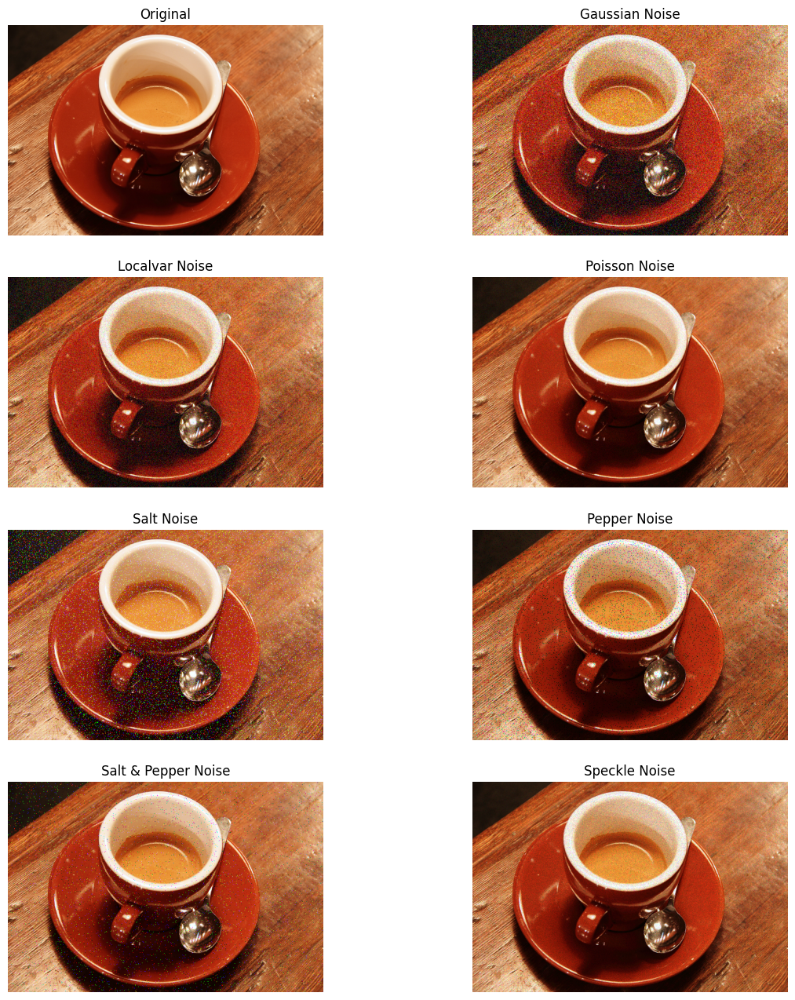

In [51]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise


img_rgb = img_as_float(data.coffee())



#  noisy versions
sigma = 0.15
images = [
    img_rgb,  # Original
    random_noise(img_rgb, mode='gaussian', var=sigma**2),
    random_noise(img_rgb, mode='localvar'),
    random_noise(img_rgb, mode='poisson'),
    random_noise(img_rgb, mode='salt'),
    random_noise(img_rgb, mode='pepper'),
    random_noise(img_rgb, mode='s&p', amount=0.02),
    random_noise(img_rgb, mode='speckle')
]


titles = [
    'Original',
    'Gaussian Noise',
    'Localvar Noise',
    'Poisson Noise',
    'Salt Noise',
    'Pepper Noise',
    'Salt & Pepper Noise',
    'Speckle Noise'
]

# 4x2 panel
fig, axes = plt.subplots(4, 2, figsize=(14, 16))
axes = axes.ravel()

for i in range(8):
    axes[i].imshow(images[i])
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.show()



## **Task 3 **


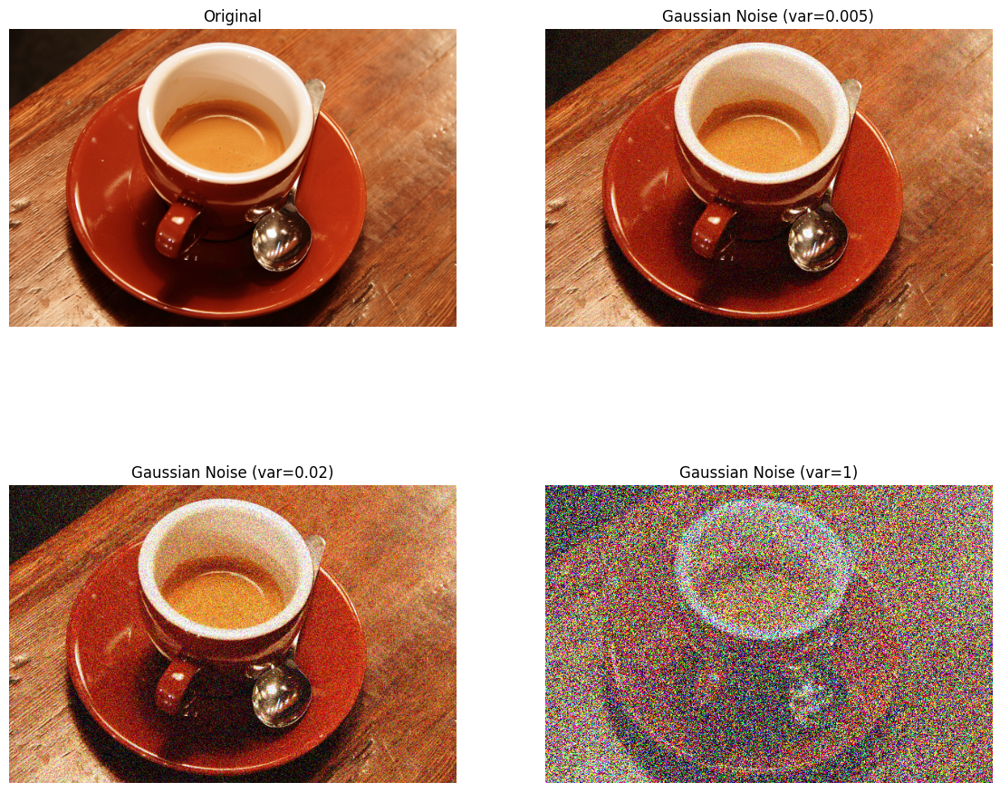

In [90]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_float
from skimage.util import random_noise


img = img_as_float(data.coffee())

#  3  Gaussian noise
noisy_image_1 = random_noise(img, mode='gaussian', var=0.005)
noisy_image_2 = random_noise(img, mode='gaussian', var=0.02)   #
noisy_image_3 = random_noise(img, mode='gaussian', var=1)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.ravel()

axes[0].imshow(img)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(noisy_image_1)
axes[1].set_title('Gaussian Noise (var=0.005)')
axes[1].axis('off')

axes[2].imshow(noisy_image_2)
axes[2].set_title('Gaussian Noise (var=0.02)')
axes[2].axis('off')

axes[3].imshow(noisy_image_3)
axes[3].set_title('Gaussian Noise (var=1)')
axes[3].axis('off')

plt.show()



## *Task 4*

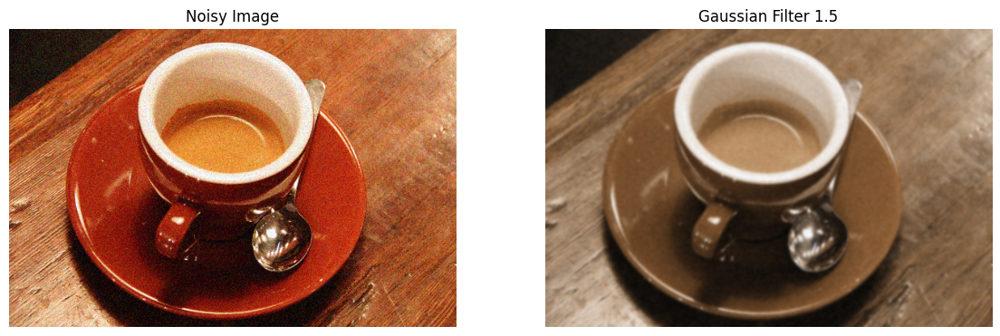

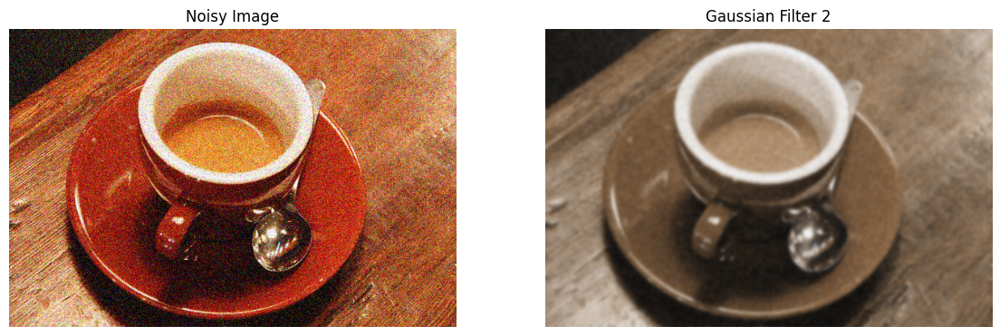

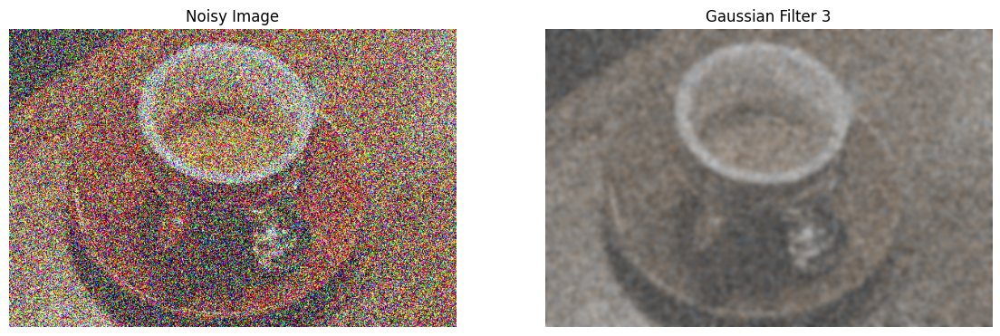

In [93]:
import matplotlib.pyplot as plt
from skimage.filters import gaussian

# Gaussian filters with different sigma values
gaussia  = gaussian(np.clip(noisy_image_1,0,1), sigma=1.5, mode='nearest')
gaussia1 = gaussian(noisy_image_2, sigma=2, mode='nearest')
gaussia2 = gaussian(noisy_image_3, sigma=3, mode='nearest')


def plot_comparison(original, filtered, filter_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True, sharey=True)
    ax1.imshow(original)
    ax1.set_title('Noisy Image')
    ax1.axis('off')
    ax2.imshow(filtered)
    ax2.set_title(filter_name)
    ax2.axis('off')
    plt.show()

plot_comparison(noisy_image_1, gaussia,  'Gaussian Filter 1.5')
plot_comparison(noisy_image_2, gaussia1, 'Gaussian Filter 2')
plot_comparison(noisy_image_3, gaussia2, 'Gaussian Filter 3')

# **Task 5 **

(512, 512)


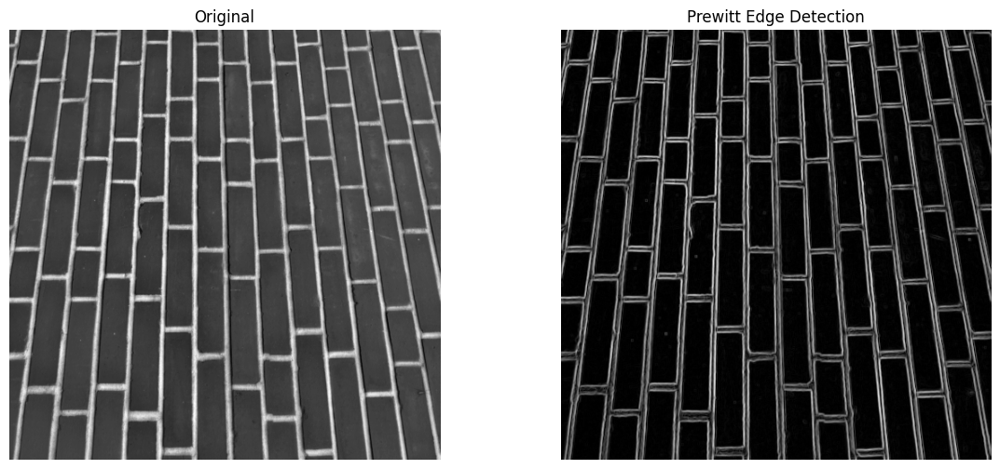

In [117]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.data import brick
from skimage.filters import prewitt
from skimage.color import rgb2gray



edge_prewitt = prewitt(image)   #  Prewitt edge detector


def plot_comparison(original, filtered, filter_name):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True, sharey=True)
    ax1.imshow(original, cmap='gray')
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap='gray')
    ax2.set_title(filter_name)
    ax2.axis('off')
    plt.show()


print(image.shape)


plot_comparison(image, edge_prewitt, 'Prewitt Edge Detection')


next part

Fraction of image that is edges: 0.2870
Fraction of image that is bricks (non-edges): 0.7130


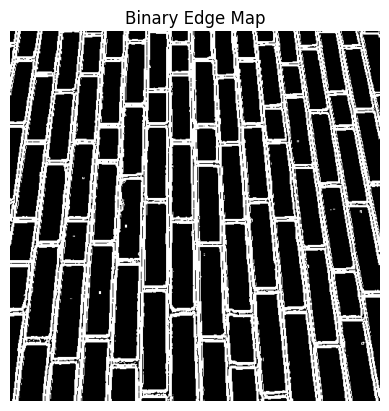

In [119]:
import numpy as np
from skimage.data import brick
from skimage.filters import prewitt
import matplotlib.pyplot as plt

image = brick()
edges = prewitt(image)

threshold = np.mean(edges)
binary_edge_map = edges > threshold
   # quantify
total_pixels = binary_edge_map.size
edge_pixels = np.sum(binary_edge_map)
brick_pixels = total_pixels - edge_pixels

edge_fraction = edge_pixels / total_pixels    #edge fraction
brick_fraction = brick_pixels / total_pixels   #bridge fraction


print(f"Fraction of image that is edges: {edge_fraction:.4f}")   #printing results
print(f"Fraction of image that is bricks (non-edges): {brick_fraction:.4f}")

plt.imshow(binary_edge_map, cmap='gray')   # visuals
plt.title('Binary Edge Map')
plt.axis('off')
plt.show()


# *Task* 6

# **FFT**

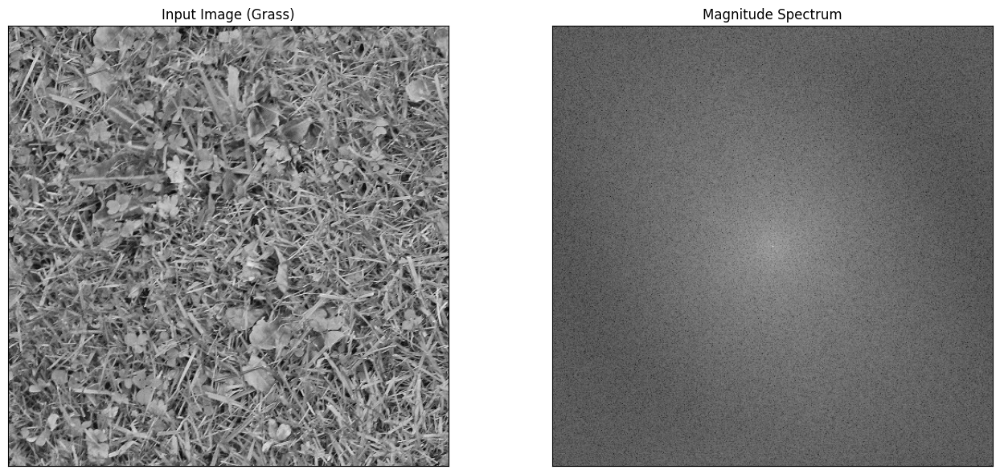

In [124]:
import numpy as np
from skimage import data
from skimage.color import rgb2gray
from matplotlib import pyplot as plt


img = data.grass()


# Apply FFT and shift
f = np.fft.fft2(img)                    # 2D FFT
fshift = np.fft.fftshift(f)            # Shift zero frequency to center
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1e-8)  # Log scale, avoid log(0)


fig = plt.figure(figsize=(14, 6))

plt.subplot(121)
plt.imshow(img, cmap='gray')
plt.title('Input Image (Grass)')
plt.xticks([]), plt.yticks([])

plt.subplot(122)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Magnitude Spectrum')
plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.savefig('frequency_grass.png')
plt.show()


# **HPF**

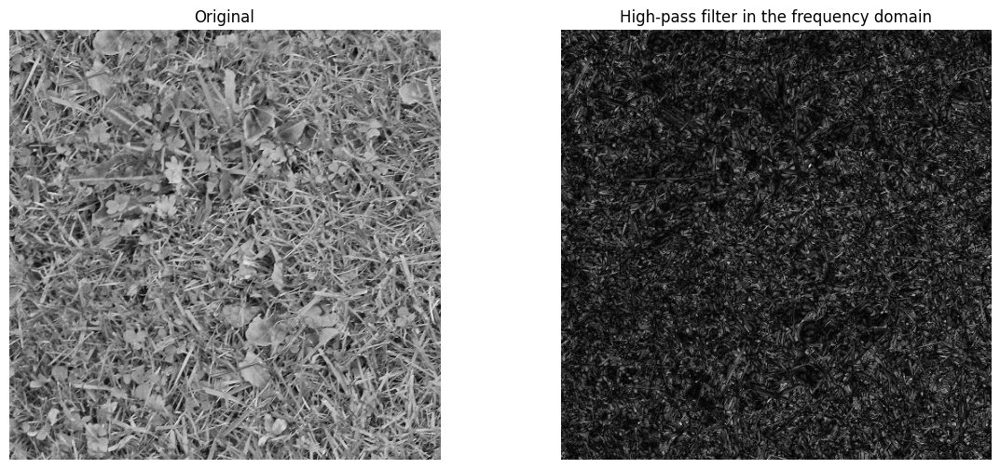

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

img = data.grass()


f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
rows, cols = img.shape   # Get image center
crow, ccol = rows // 2, cols // 2  # use standard int division


fshift[crow-30:crow+30, ccol-30:ccol+30] = 0   # Apply High-Pass Filter: zero-out low frequencies in the center

# Inverse FFT
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)


plot_comparison(img, img_back, 'High-pass filter in the frequency domain')


# LPF

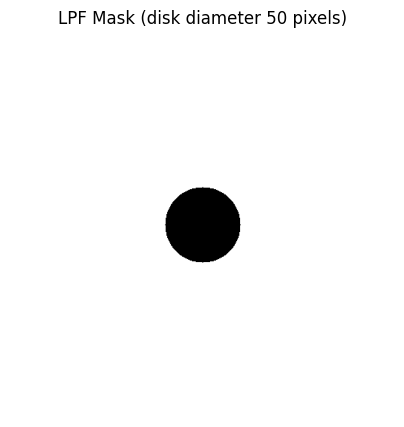

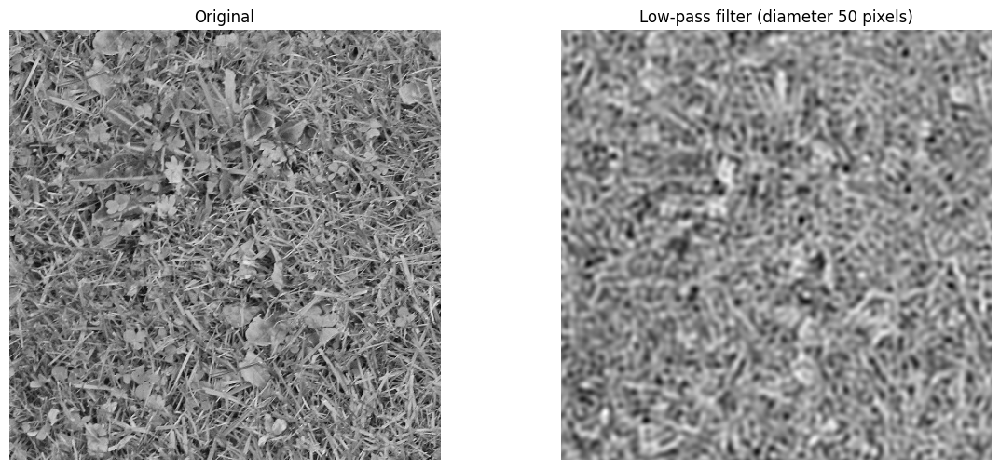

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data


img = data.grass()


nrows, ncols = img.shape  # Define LPF parameters
row, col = np.ogrid[:nrows, :ncols]
cnt_row, cnt_col = nrows / 2, ncols / 2
disk_diameter = 50


outer_disk_mask = ((row - cnt_row)**2 + (col - cnt_col)**2 > (disk_diameter)**2)


f = np.fft.fft2(img)  # Apply FFT
fshift = np.fft.fftshift(f)

# Apply LPF mask
fshift[outer_disk_mask] = 0

# Inverse FFT
f_ishift = np.fft.ifftshift(fshift)
img_back = np.abs(np.fft.ifft2(f_ishift))


fig = plt.figure(figsize=(5, 5))
plt.imshow(outer_disk_mask, cmap='gray')
plt.title(f'LPF Mask (disk diameter {disk_diameter} pixels)')
plt.axis('off')
plt.show()

plot_comparison(img, img_back, f'Low-pass filter (diameter {disk_diameter} pixels)')


# *Task* 7


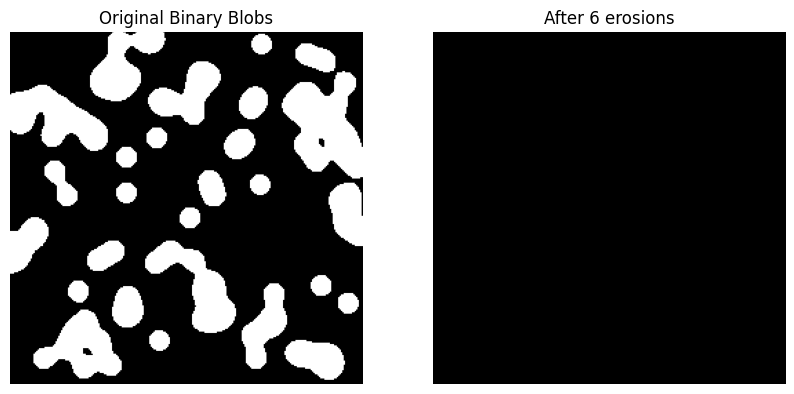

✅ Total erosions needed to remove all blobs: 6


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk


np.random.seed(1)


image = binary_blobs(length=256, blob_size_fraction=0.1, volume_fraction=0.3)  #Generate binary blobs without the `seed` parameter


selem = disk(3) #disk-shaped structuring element


eroded = image.copy()  # Erode until image is black
iterations = 0

while np.any(eroded):
    eroded = erosion(eroded, selem)
    iterations += 1

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.imshow(image, cmap='gray')
ax1.set_title('Original Binary Blobs')
ax1.axis('off')

ax2.imshow(eroded, cmap='gray')
ax2.set_title(f'After {iterations} erosions')
ax2.axis('off')
plt.show()

print(f"✅ Total erosions needed to remove all blobs: {iterations}")

